# Notebook used to visualize the synthetic data

In [1]:
from table_evaluator import TableEvaluator
from datasets import load_dataset
import pandas as pd

IPython not installed.


c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Adult income

In [6]:
data = load_dataset('scikit-learn/adult-census-income', split="train").to_pandas()
synth = pd.read_csv("synth_samples/adult_synthetic.csv")

synth.drop('Unnamed: 0', axis=1, inplace=True)

print(f"original shape: {data.shape}")
print(f"synthetic shape: {synth.shape}")

original shape: (32561, 15)
synthetic shape: (32500, 15)


In [7]:
synth.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education.num',
       'marital.status', 'occupation', 'relationship', 'race', 'sex',
       'capital.gain', 'capital.loss', 'hours.per.week', 'native.country',
       'income'],
      dtype='object')

In [8]:
cat_cols = ["workclass", "education", "marital.status", "occupation", "relationship", "race", "sex", "native.country", "income"]

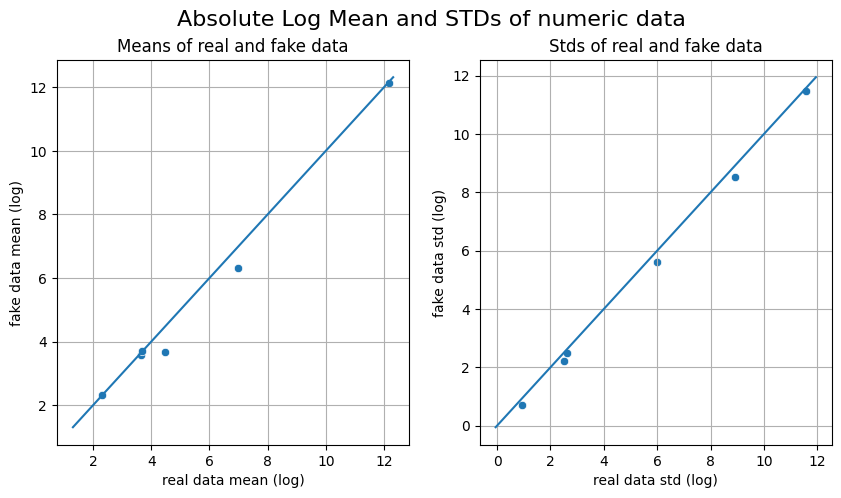

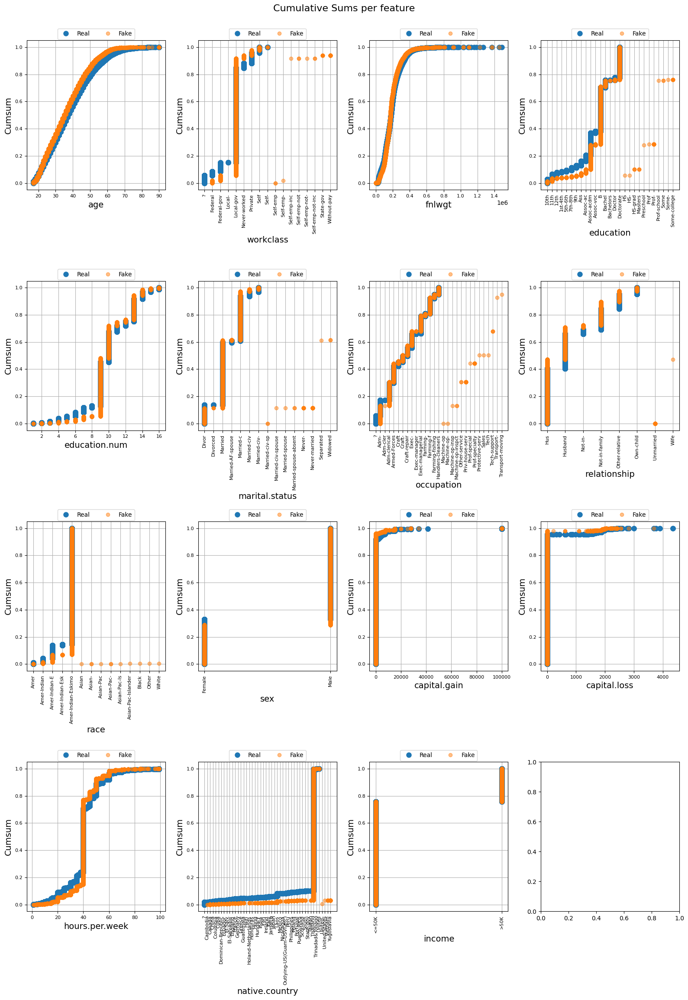

c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='vertical')
c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='vertical')
c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='ver

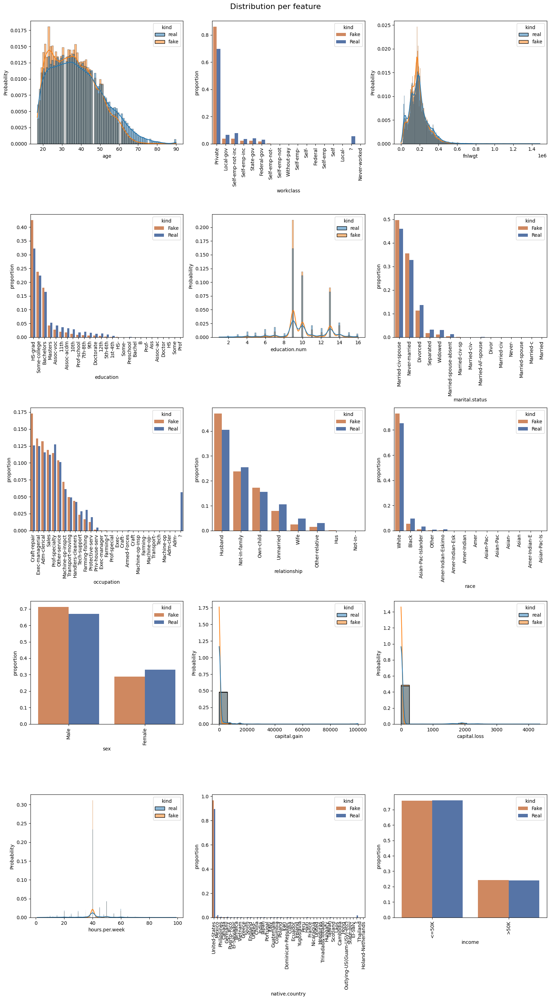

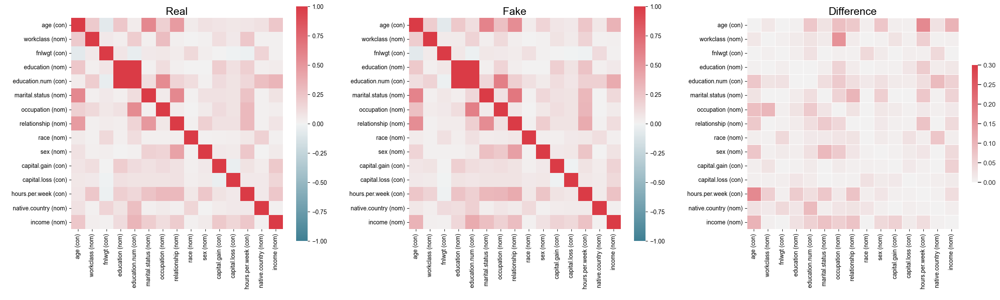

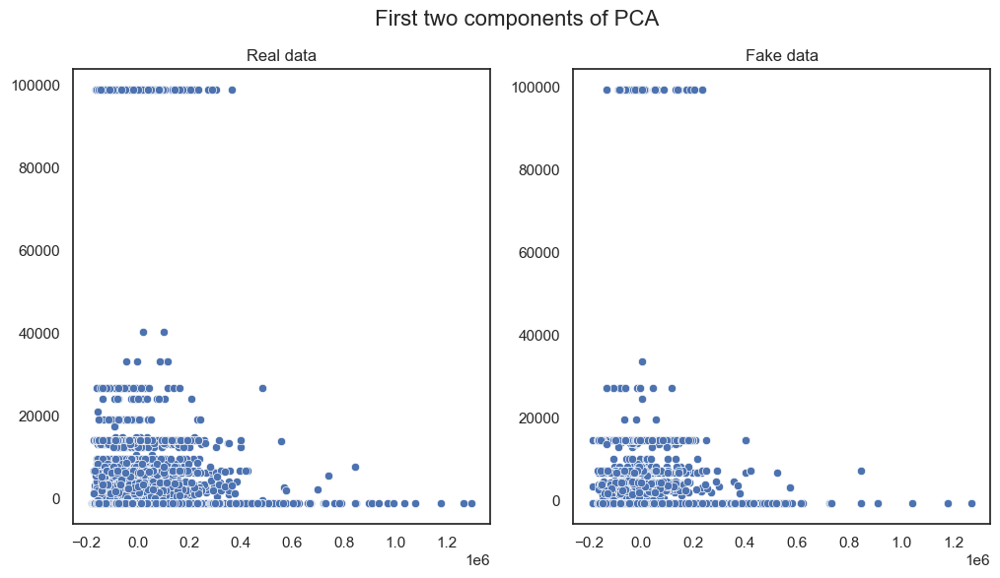

In [9]:
table_eval = TableEvaluator(data, synth, cat_cols=cat_cols)

table_eval.visual_evaluation()

## California housing

In [5]:
real = pd.read_csv("housing.csv")
fake = pd.read_csv("synth_samples/housing_synthetic.csv")

fake.drop("Unnamed: 0", axis=1, inplace=True)

real.shape, fake.shape

((20640, 10), (20600, 10))

In [6]:
fake.head(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-118.47,34.19,34.0,2288.0,547.0,798.0,498.0,4.0000,237900.0,<1H OCEAN
1,-122.28,37.79,52.0,1660.0,437.0,1167.0,428.0,1.4141,112500.0,NEAR BAY
2,-121.56,39.12,35.0,3043.0,513.0,1469.0,479.0,3.0000,73500.0,INLAND
3,-117.93,33.85,19.0,4084.0,838.0,2319.0,843.0,4.5033,213400.0,<1H OCEAN
4,-118.36,33.91,35.0,2821.0,548.0,1398.0,543.0,4.2500,290600.0,<1H OCEAN


In [7]:
cat_cols = ["ocean_proximity"]

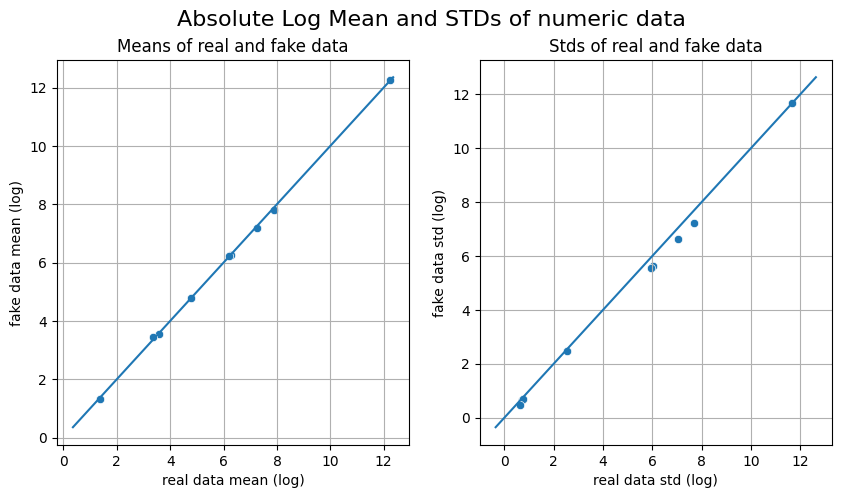

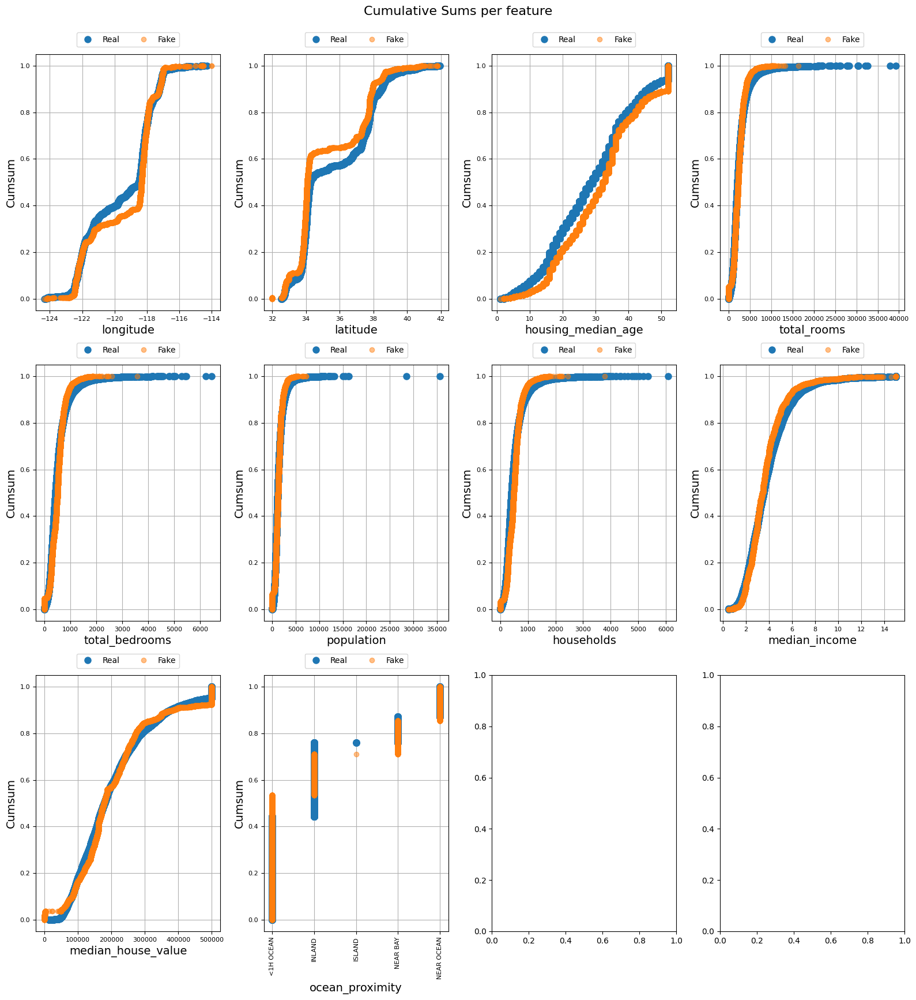

c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='vertical')


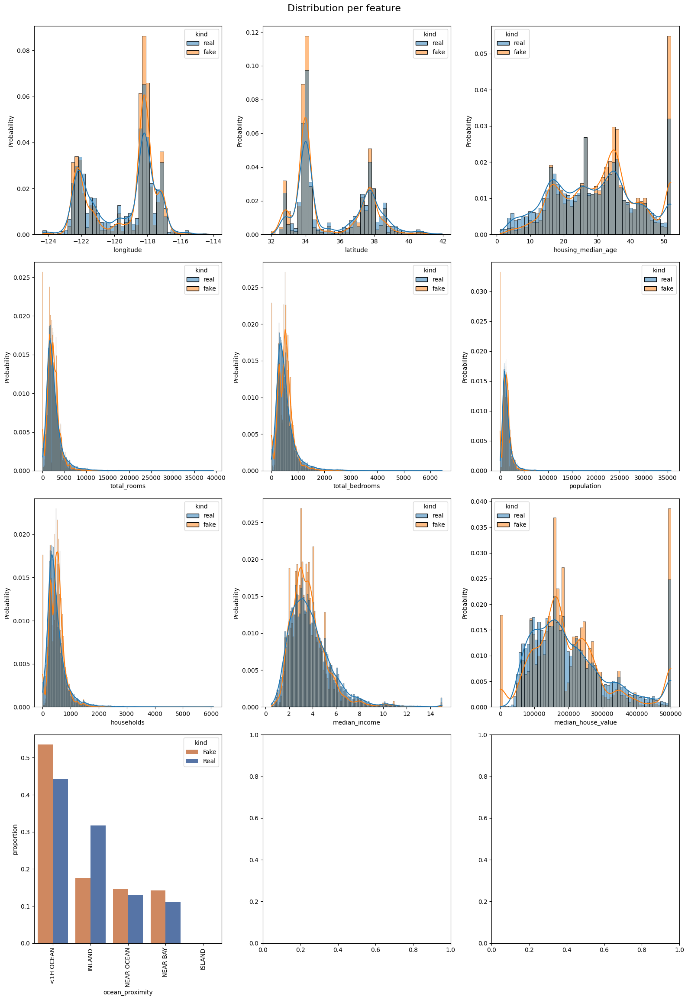

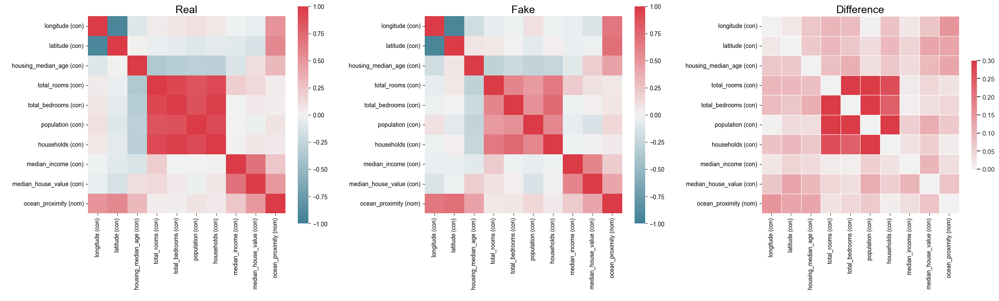

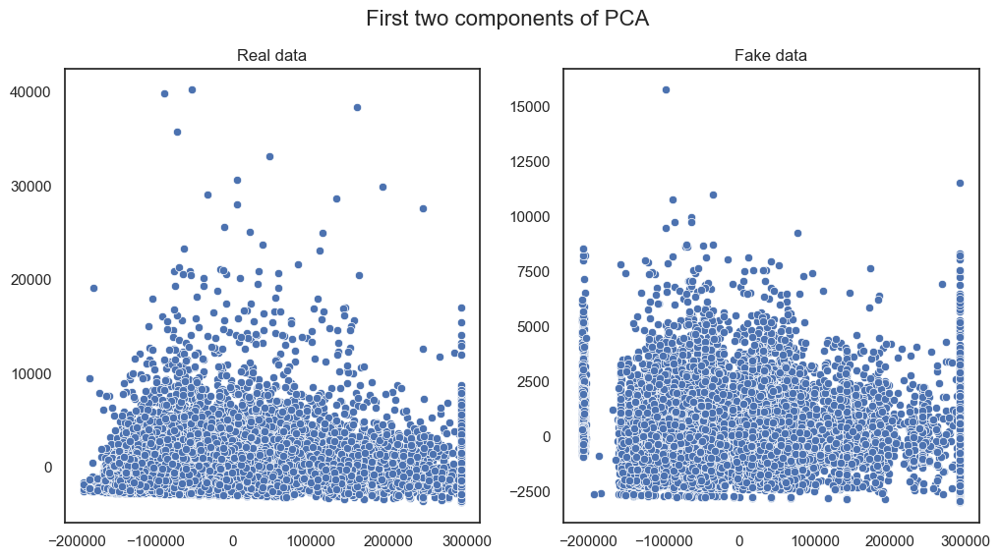

In [8]:
table_eval = TableEvaluator(real, fake, cat_cols=cat_cols)

table_eval.visual_evaluation()

In [10]:
real.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

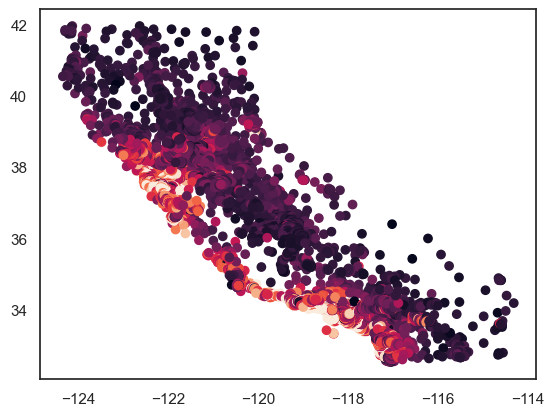

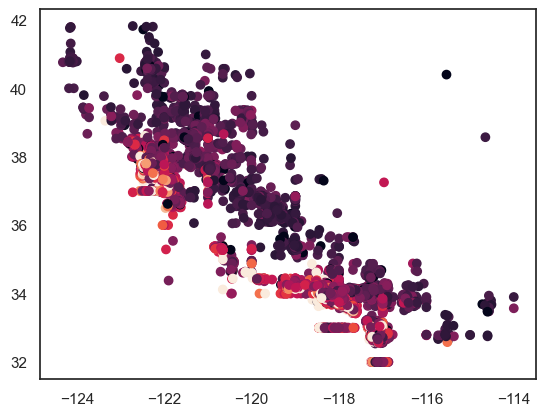

In [11]:
import matplotlib.pyplot as plt

plt.scatter(real["longitude"], real["latitude"], c=real["median_house_value"])
plt.show()

plt.scatter(fake["longitude"], fake["latitude"], c=fake["median_house_value"])
plt.show()



## HELOC

In [2]:
real = pd.read_csv("heloc.csv")
fake = pd.read_csv("synth_samples/heloc_synthetic.csv")

fake.drop("Unnamed: 0", axis=1, inplace=True)

real.shape, fake.shape

((10459, 24), (10400, 24))

In [3]:
fake.head(5)

,RiskPerformance,ExternalRiskEstimate,MSinceOldestTradeOpen,MSinceMostRecentTradeOpen,AverageMInFile,NumSatisfactoryTrades,NumTrades60Ever2DerogPubRec,NumTrades90Ever2DerogPubRec,PercentTradesNeverDelq,MSinceMostRecentDelq,...,PercentInstallTrades,MSinceMostRecentInqexcl7days,NumInqLast6M,NumInqLast6Mexcl7days,NetFractionRevolvingBurden,NetFractionInstallBurden,NumRevolvingTradesWBalance,NumInstallTradesWBalance,NumBank2NatlTradesWHighUtilization,PercentTradesWBalance
0,Bad,59.0,140.0,6.0,63.0,21.0,0.0,0.0,81.0,2.0,...,19.0,-7.0,1.0,1.0,55.0,-8.0,7.0,1.0,1.0,91.0
1,Bad,68.0,267.0,1.0,69.0,28.0,0.0,0.0,97.0,5.0,...,30.0,0.0,1.0,1.0,8.0,-8.0,4.0,1.0,0.0,64.0
2,Bad,57.0,191.0,12.0,74.0,17.0,1.0,0.0,78.0,4.0,...,44.0,0.0,1.0,1.0,31.0,61.0,3.0,3.0,1.0,80.0
3,Bad,77.0,44.0,21.0,48.0,4.0,0.0,0.0,80.0,79.0,...,80.0,0.0,0.0,0.0,-8.0,58.0,-8.0,2.0,-8.0,100.0
4,Bad,65.0,37.0,2.0,18.0,5.0,0.0,0.0,100.0,-7.0,...,80.0,0.0,2.0,2.0,99.0,81.0,3.0,2.0,1.0,100.0


In [4]:
cat_cols = ["RiskPerformance"]

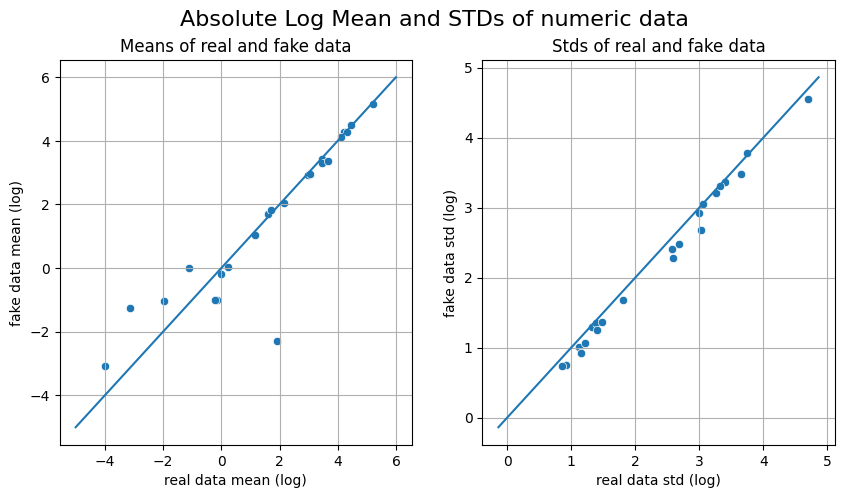

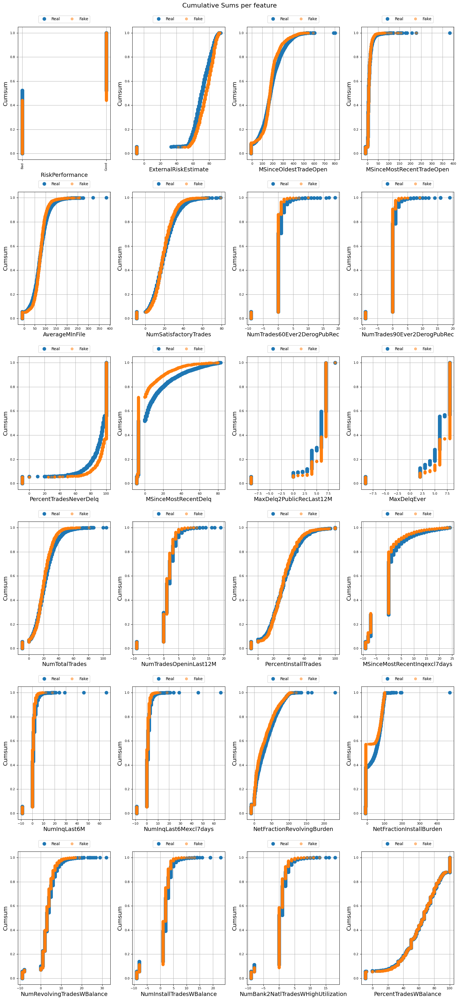

c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='vertical')


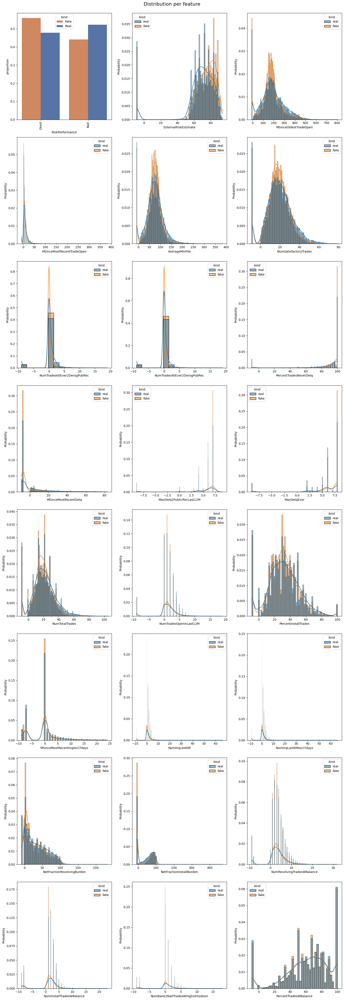

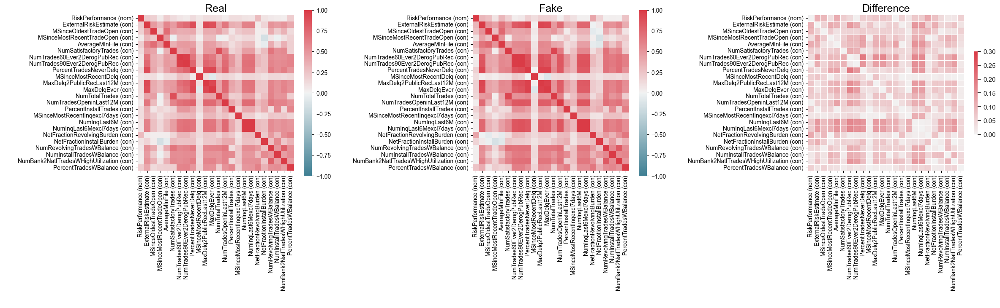

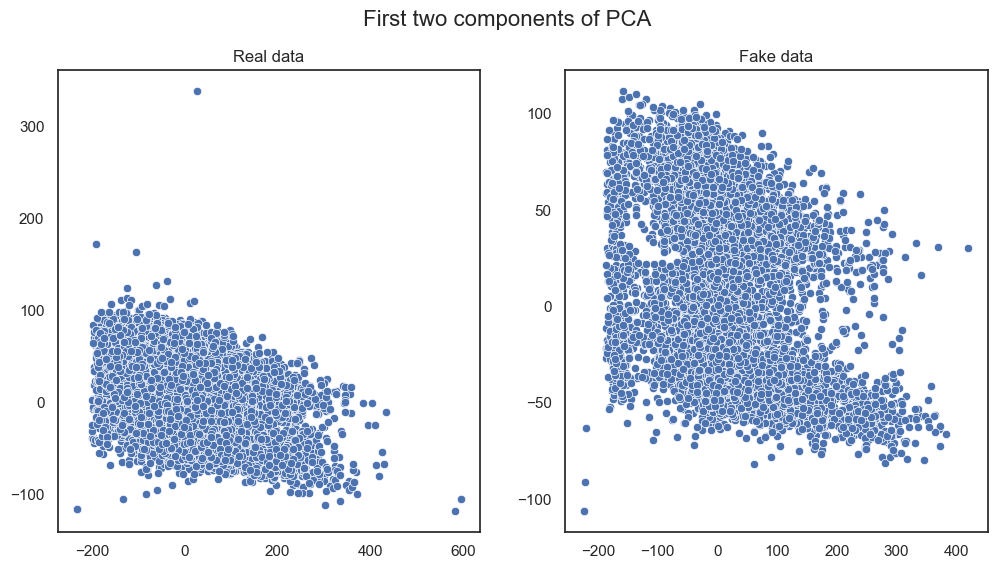

In [6]:
table_eval = TableEvaluator(real, fake, cat_cols=cat_cols)

table_eval.visual_evaluation()

## sick

In [7]:
real = pd.read_csv("sick.csv")
fake = pd.read_csv("synth_samples/sick_synthetic.csv")

fake.drop("Unnamed: 0", axis=1, inplace=True)

real.shape, fake.shape

((3772, 30), (3700, 30))

In [8]:
fake.head(5)

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,...,TT4_measured,TT4,T4U_measured,T4U,FTI_measured,FTI,TBG_measured,TBG,referral_source,Class
0,44.0,F,f,f,f,f,f,f,t,f,...,t,113.0,t,1.02,t,112.0,f,NaN,other,negative
1,64.0,F,f,f,f,f,f,f,f,f,...,t,116.0,t,1.08,t,109.0,f,NaN,other,negative
2,33.0,F,f,f,f,f,f,f,f,f,...,t,85.0,t,0.92,t,93.0,f,NaN,SVHC,negative
3,25.0,F,t,f,f,f,f,f,f,f,...,t,108.0,t,1.08,t,98.0,f,NaN,other,negative
4,57.0,M,f,f,f,f,f,f,f,f,...,t,82.0,t,0.90,t,92.0,f,NaN,SVI,negative


In [13]:
cat_cols = ["sex",
            "on_thyroxine",
            "query_on_thyroxine",
            'on_antithyroid_medication',
            'sick',
            "pregnant",
            'thyroid_surgery',
            'I131_treatment',
            'query_hypothyroid',
            'query_hyperthyroid',
            'lithium',
            'goitre',
            'tumor',
            'hypopituitary',
            'psych',
            'TSH_measured',
            'T3_measured',
            'TT4_measured',
            'T4U_measured',
            'FTI_measured',
            'TBG_measured',
            'TBG',
            'referral_source',
            'Class']

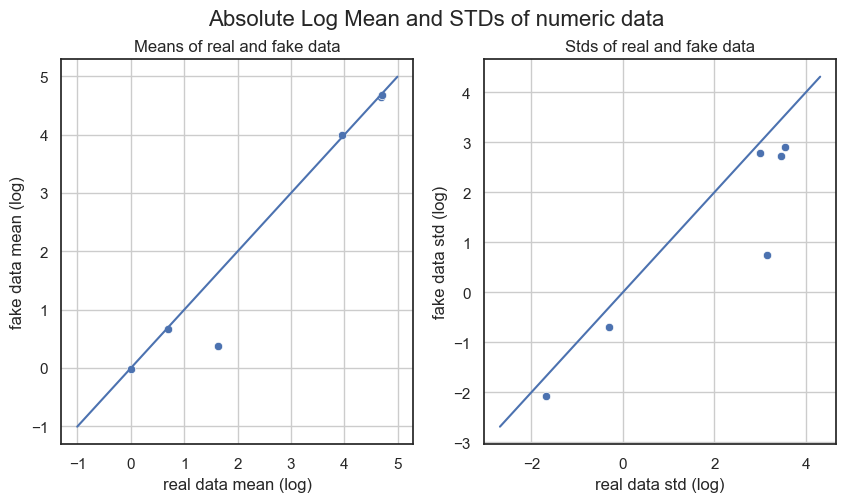

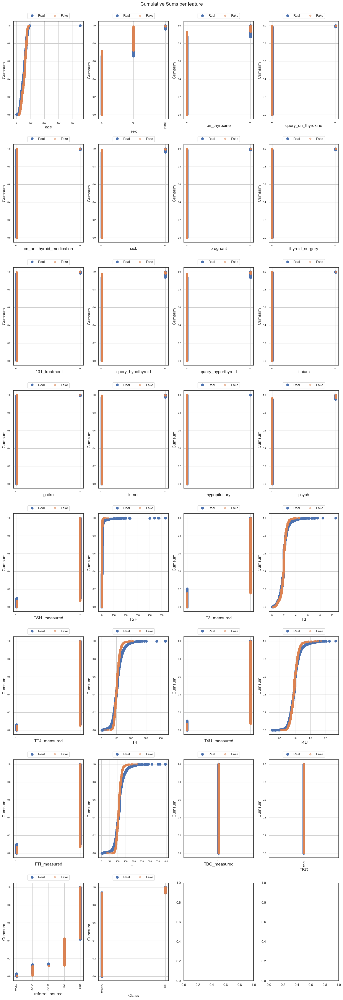

c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='vertical')
c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='vertical')
c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='ver

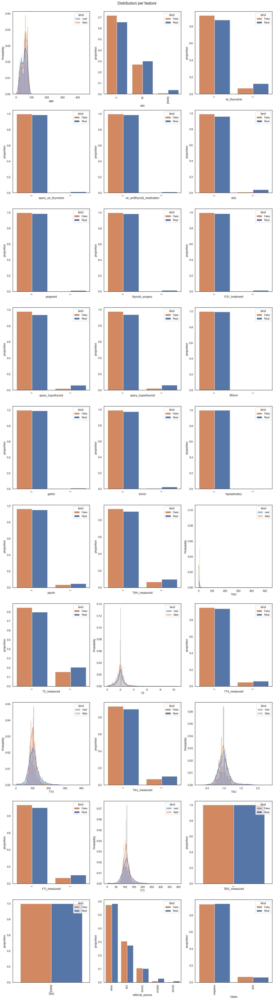

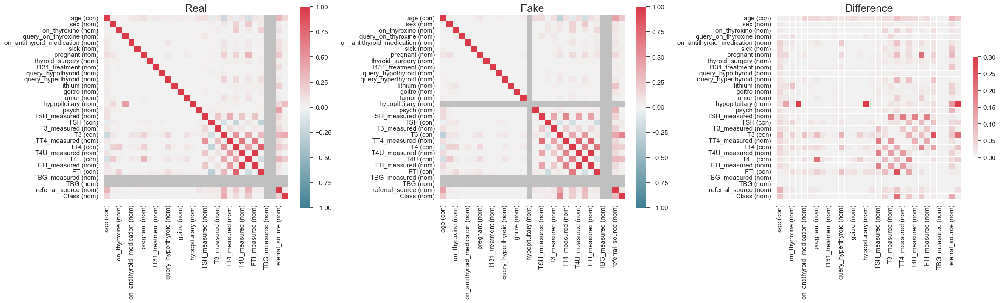

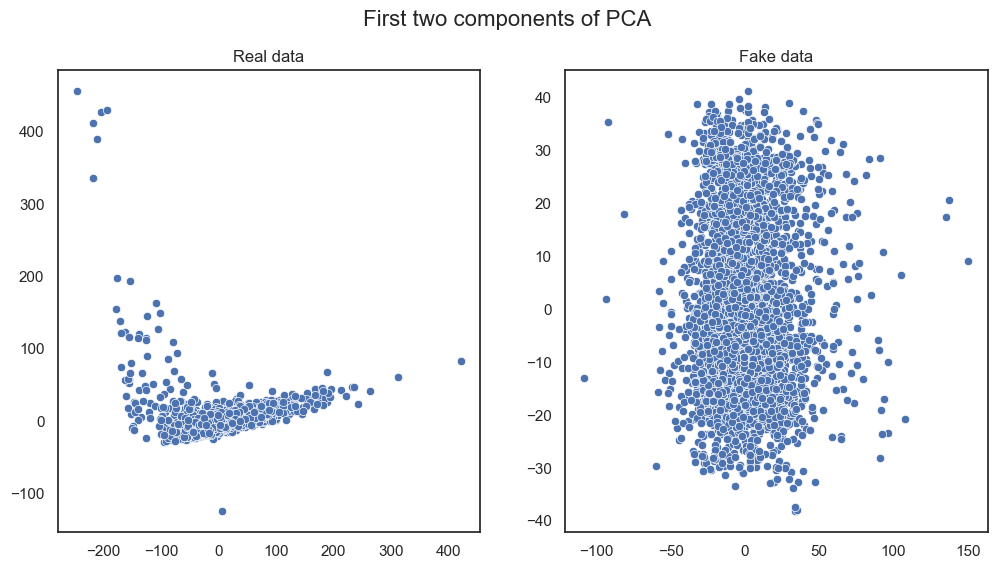

In [14]:
table_eval = TableEvaluator(real, fake, cat_cols=cat_cols)

table_eval.visual_evaluation()

## adult rename

In [2]:
real = load_dataset('scikit-learn/adult-census-income', split="train").to_pandas()
cols = real.columns
cols

Index(['age', 'workclass', 'fnlwgt', 'education', 'education.num',
       'marital.status', 'occupation', 'relationship', 'race', 'sex',
       'capital.gain', 'capital.loss', 'hours.per.week', 'native.country',
       'income'],
      dtype='object')

In [3]:
mapping = {}
letters = "ABCDEFGHIJKLMNOPQRSTUVWXYZ"
for i, letter in enumerate(letters[:len(cols)]):
    mapping[letter] = cols[i]
mapping

{'A': 'age',
 'B': 'workclass',
 'C': 'fnlwgt',
 'D': 'education',
 'E': 'education.num',
 'F': 'marital.status',
 'G': 'occupation',
 'H': 'relationship',
 'I': 'race',
 'J': 'sex',
 'K': 'capital.gain',
 'L': 'capital.loss',
 'M': 'hours.per.week',
 'N': 'native.country',
 'O': 'income'}

In [4]:
fake_rename = pd.read_csv("synth_samples/adult_rename_synthetic.csv")
fake = pd.read_csv("synth_samples/adult_synthetic.csv")

fake.drop("Unnamed: 0", axis=1, inplace=True)
fake_rename.drop("Unnamed: 0", axis=1, inplace=True)

In [5]:
fake_rename.head(5)

,A,B,C,D,E,F,G,H,I,J,K,L,M,N,O
0,59.0,Private,152657.0,Bachelors,13.0,Married-civ-spouse,Sales,Husband,White,Male,4064.0,0.0,40.0,United-States,<=50K
1,25.0,Private,284531.0,HS-grad,9.0,Married-civ-spouse,Craft-repair,Husband,White,Male,0.0,0.0,50.0,United-States,<=50K
2,48.0,Private,153143.0,Some-college,10.0,Divorced,Machine-op-inspct,Not-in-family,White,Female,0.0,0.0,40.0,United-States,<=50K
3,20.0,Private,231962.0,HS-grad,9.0,Never-married,Farming-fishing,Own-child,White,Male,0.0,0.0,35.0,United-States,<=50K
4,34.0,Self-emp-not-inc,157947.0,HS-grad,9.0,Divorced,Other-service,Unmarried,White,Female,0.0,0.0,40.0,United-States,<=50K


In [6]:
fake_rename = fake_rename.rename(columns=mapping)
fake_rename.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,59.0,Private,152657.0,Bachelors,13.0,Married-civ-spouse,Sales,Husband,White,Male,4064.0,0.0,40.0,United-States,<=50K
1,25.0,Private,284531.0,HS-grad,9.0,Married-civ-spouse,Craft-repair,Husband,White,Male,0.0,0.0,50.0,United-States,<=50K
2,48.0,Private,153143.0,Some-college,10.0,Divorced,Machine-op-inspct,Not-in-family,White,Female,0.0,0.0,40.0,United-States,<=50K
3,20.0,Private,231962.0,HS-grad,9.0,Never-married,Farming-fishing,Own-child,White,Male,0.0,0.0,35.0,United-States,<=50K
4,34.0,Self-emp-not-inc,157947.0,HS-grad,9.0,Divorced,Other-service,Unmarried,White,Female,0.0,0.0,40.0,United-States,<=50K


In [8]:
cat_cols = ["workclass", "education", "marital.status", "occupation", "relationship", "race", "sex", "native.country", "income"]

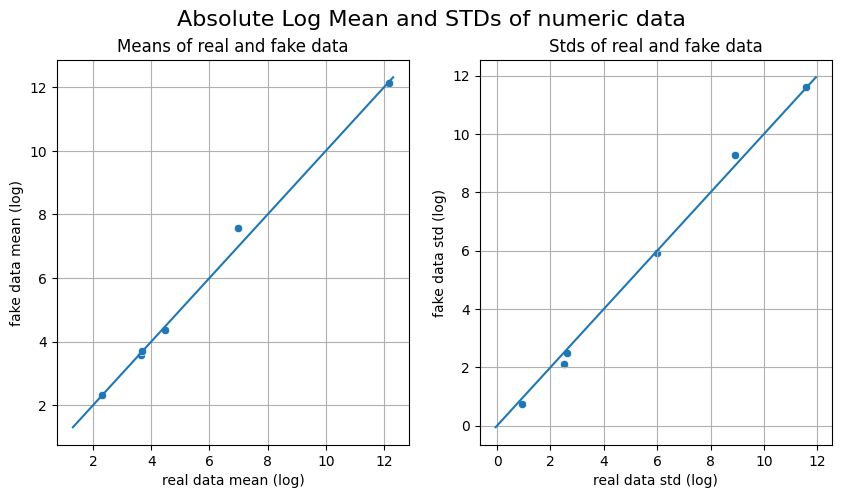

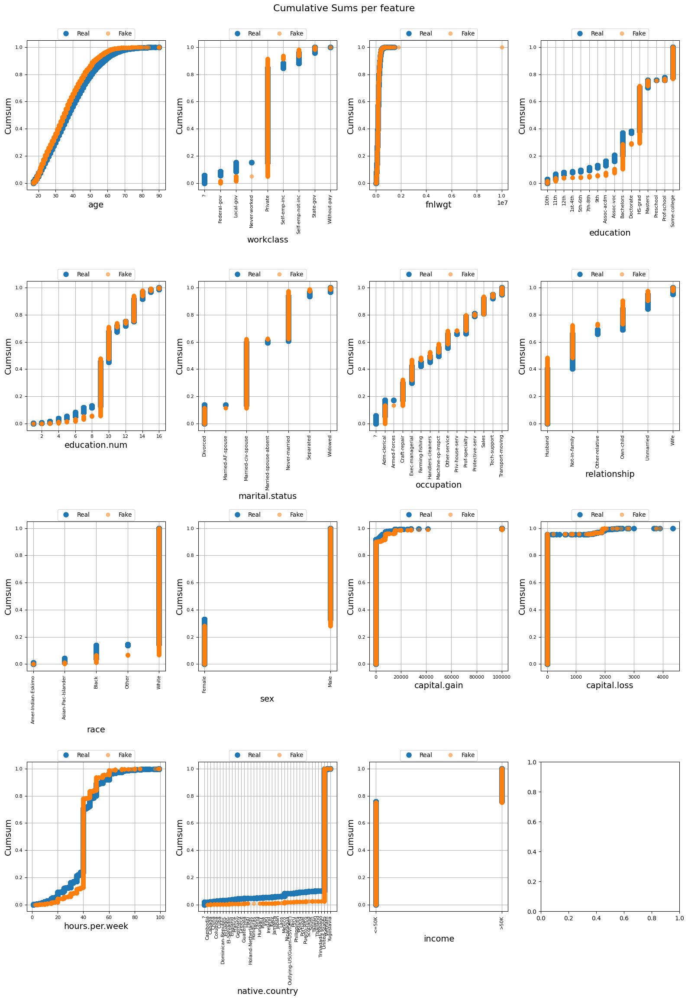

c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='vertical')
c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='vertical')
c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='ver

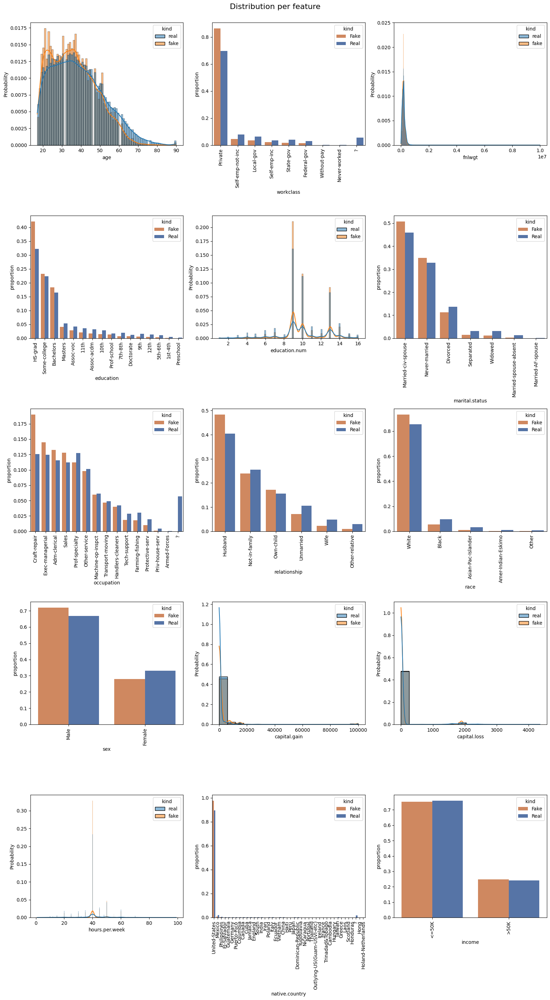

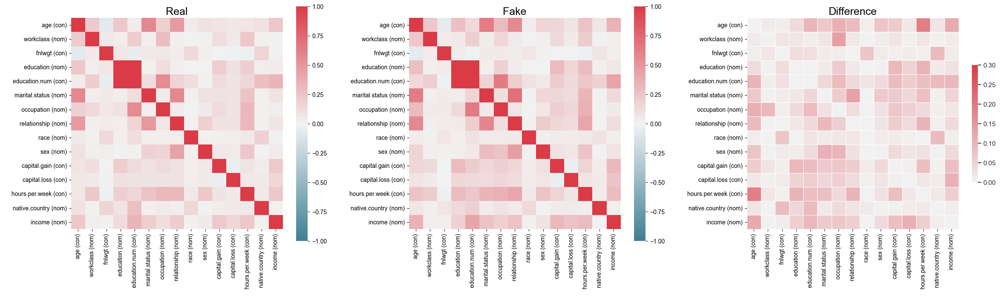

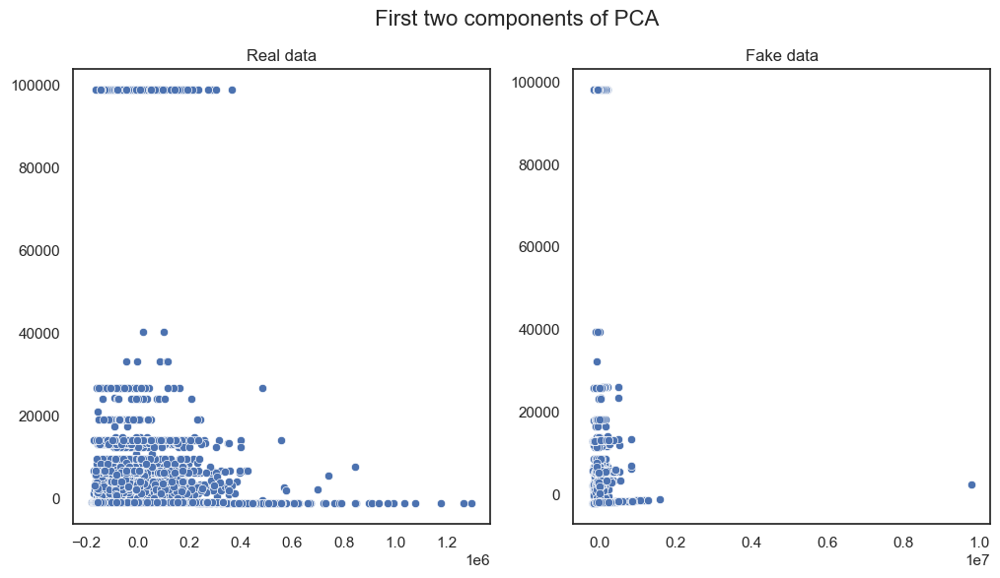

In [9]:
table_eval = TableEvaluator(real, fake_rename, cat_cols=cat_cols)
table_eval.visual_evaluation()

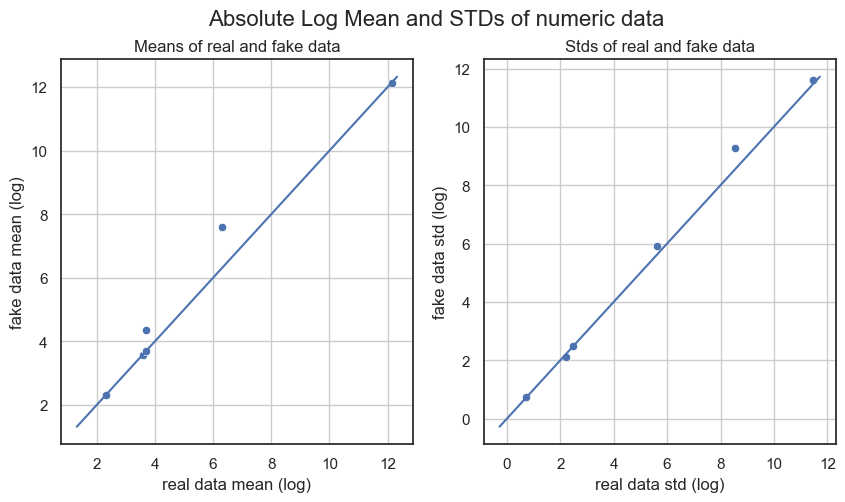

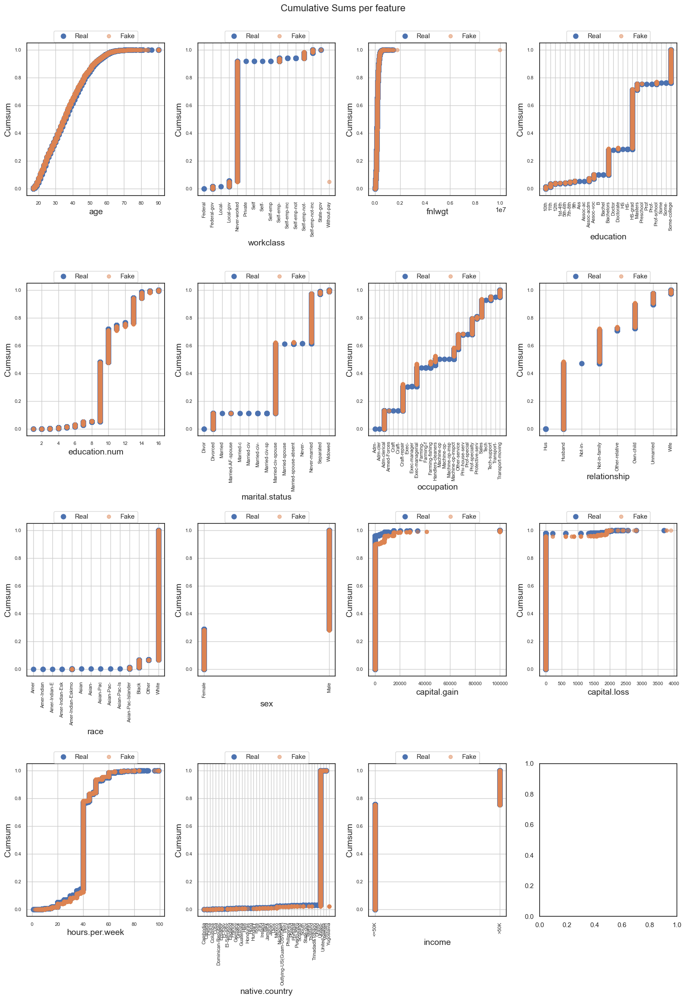

c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='vertical')
c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='vertical')
c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='ver

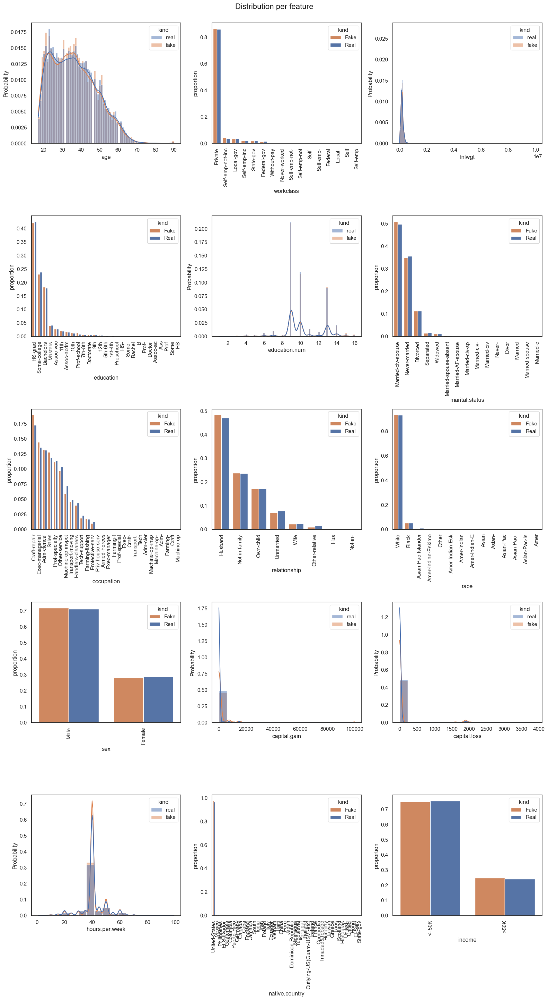

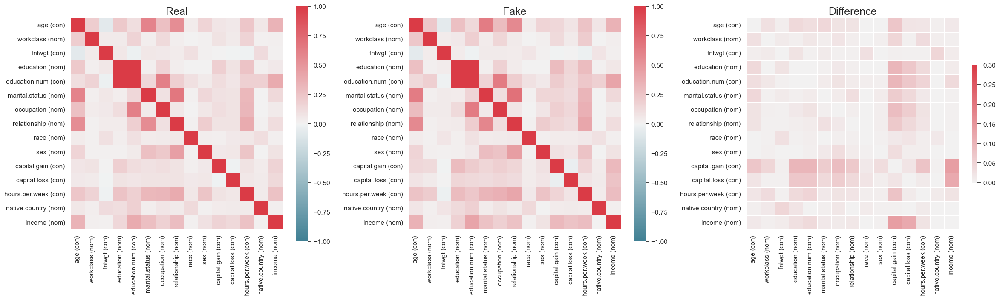

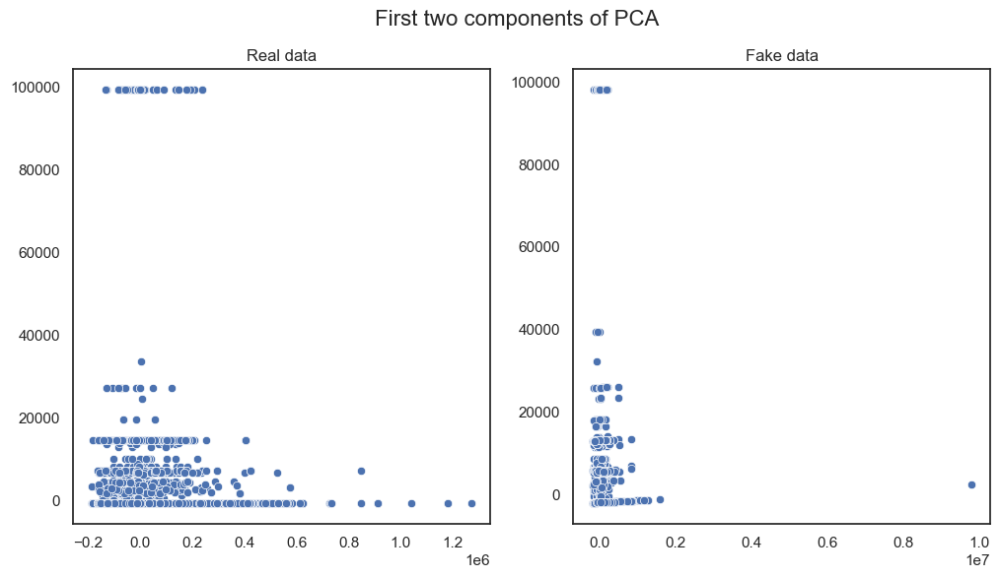

In [10]:
table_eval = TableEvaluator(fake, fake_rename, cat_cols=cat_cols)
table_eval.visual_evaluation()

## adult full rename

In [2]:
real = load_dataset('scikit-learn/adult-census-income', split="train").to_pandas()
fake = pd.read_csv("synth_samples/adult_full_rename_synthetic_translated.csv")
real.shape, fake.shape

((32561, 15), (32500, 15))

In [3]:
cat_cols = ["workclass", "education", "marital.status", "occupation", "relationship", "race", "sex", "native.country", "income"]

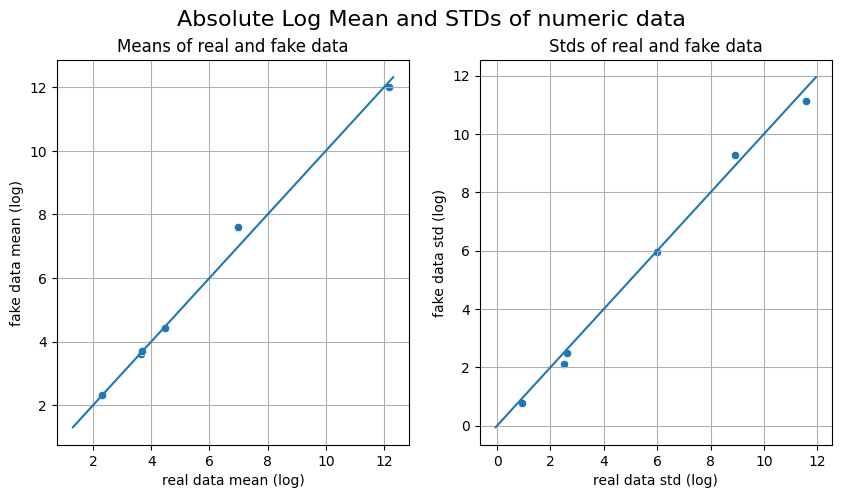

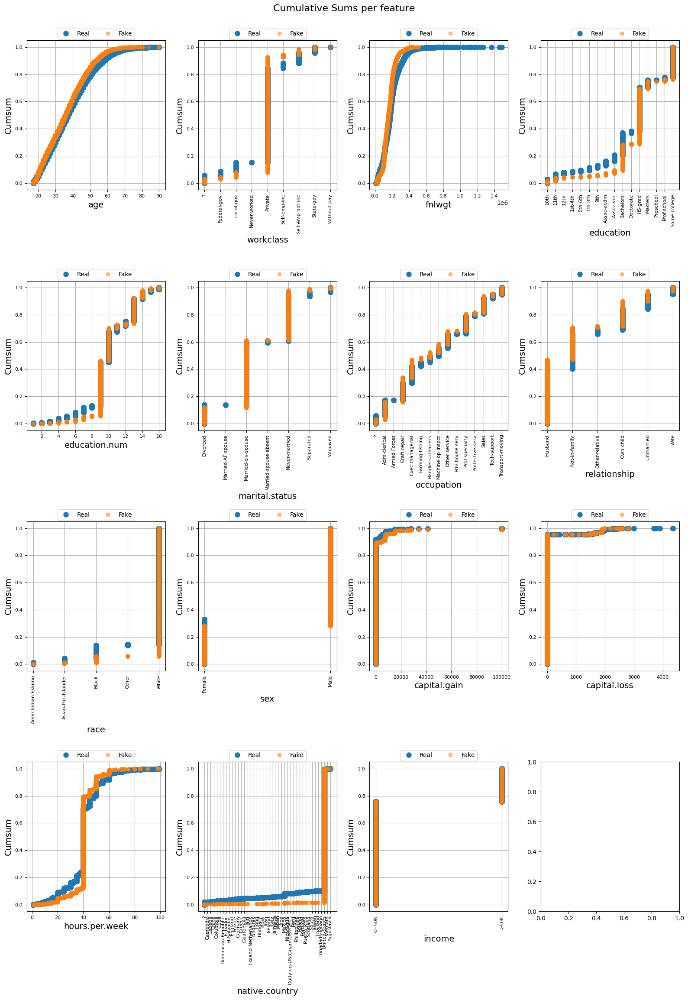

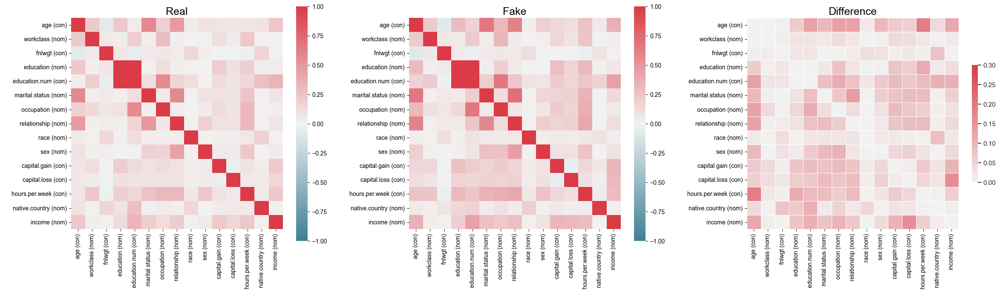

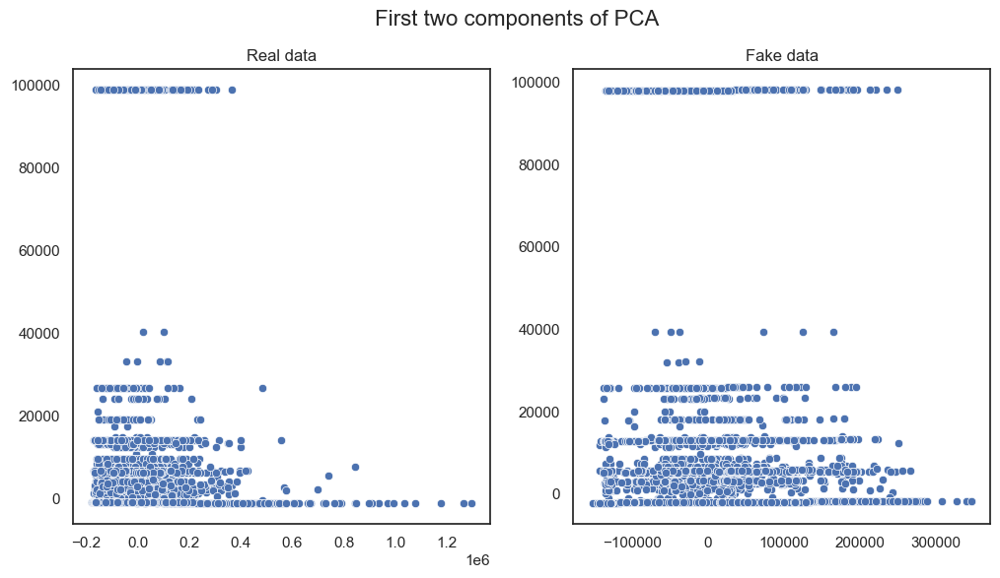

In [4]:
table_eval = TableEvaluator(real, fake, cat_cols=cat_cols)
table_eval.visual_evaluation()

## california housing renamed

In [5]:
real = pd.read_csv("housing.csv")
fake = pd.read_csv("synth_samples/housing_renamed_synthetic_translated.csv")

real.shape, fake.shape

((20640, 10), (20500, 10))

In [6]:
real["households"]

0         126.0
1        1138.0
2         177.0
3         219.0
4         259.0
          ...  
20635     330.0
20636     114.0
20637     433.0
20638     349.0
20639     530.0
Name: households, Length: 20640, dtype: float64

In [7]:
cat_cols = ["ocean_proximity"]

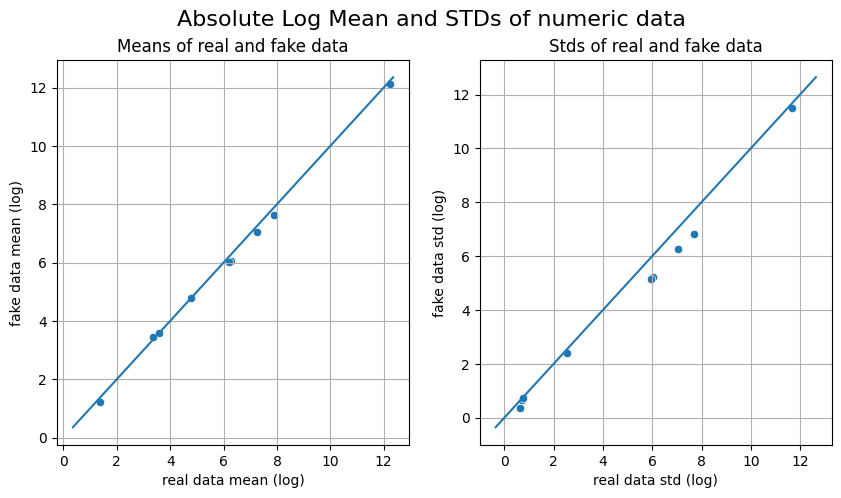

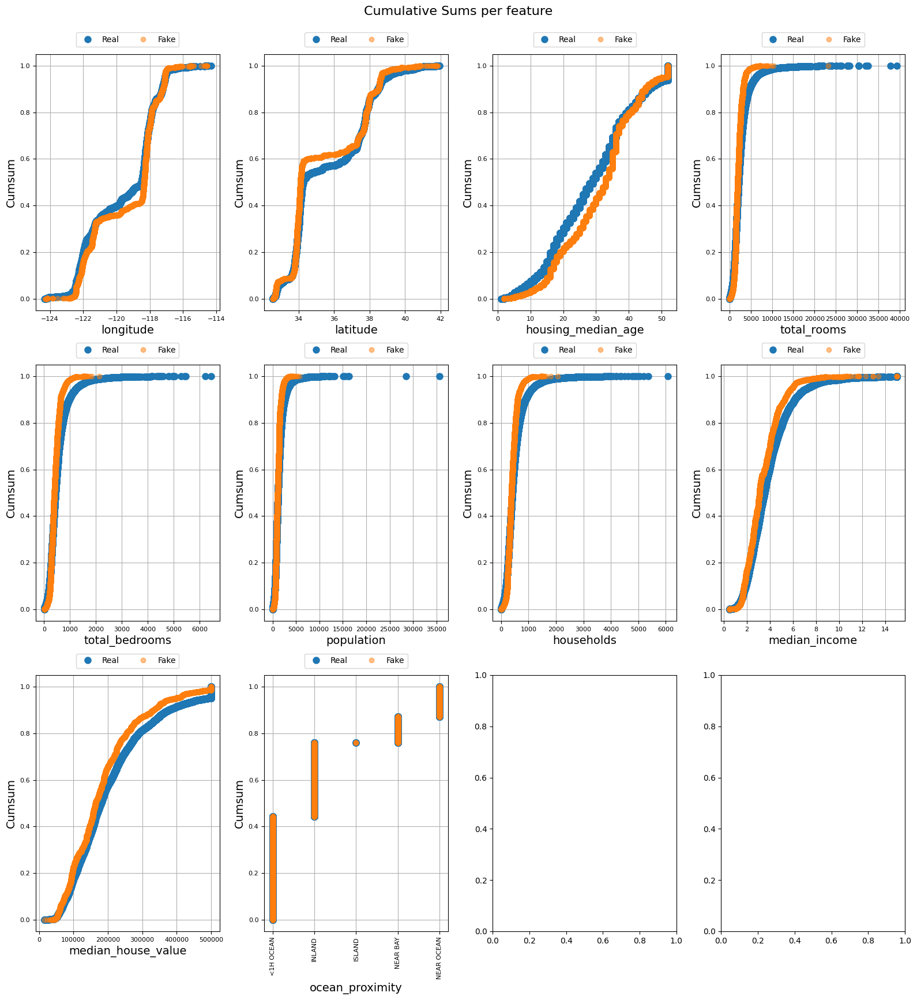

c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='vertical')


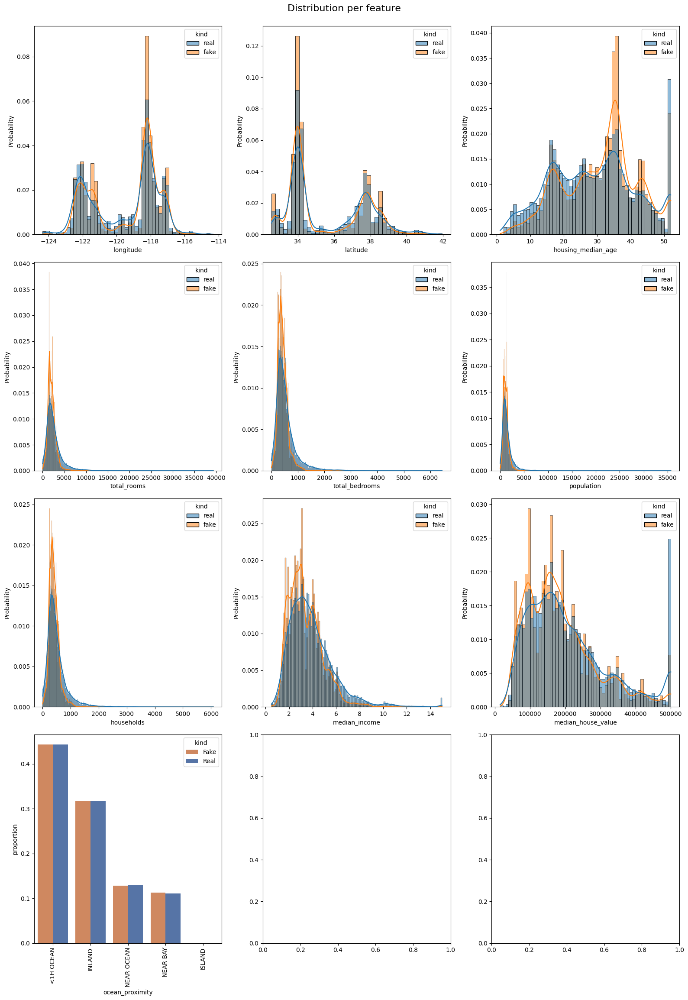

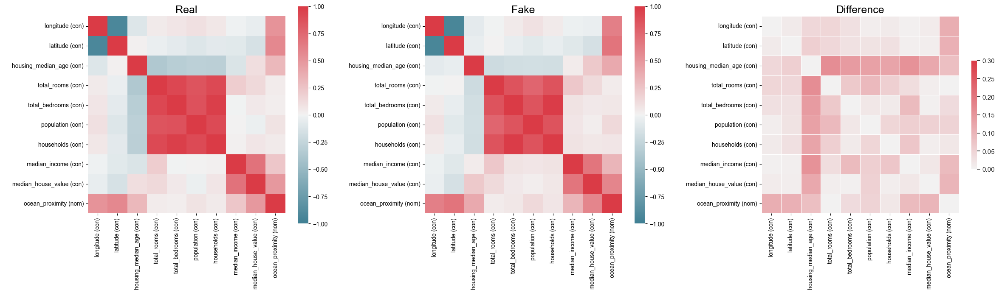

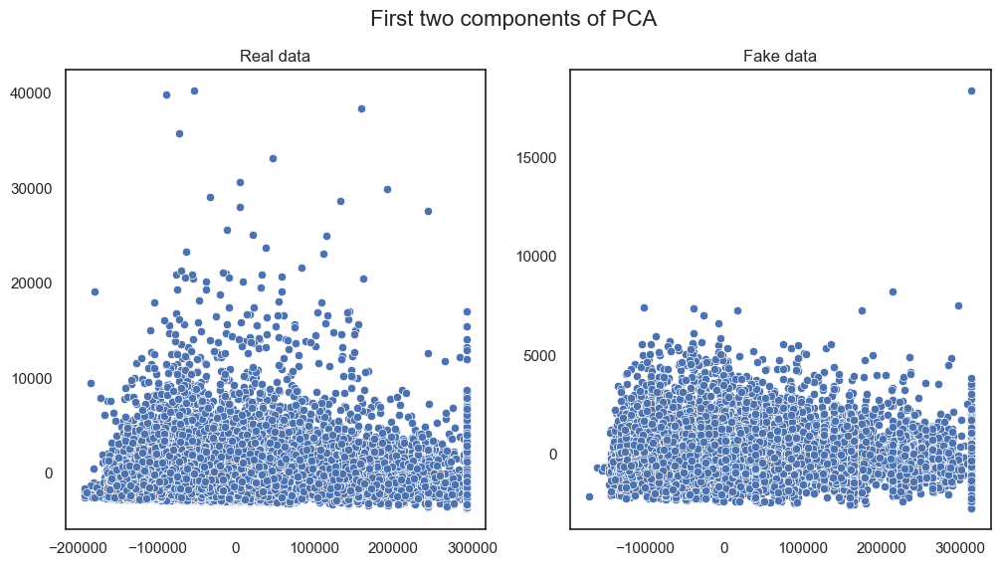

In [8]:
table_eval = TableEvaluator(real, fake, cat_cols=cat_cols)
table_eval.visual_evaluation()

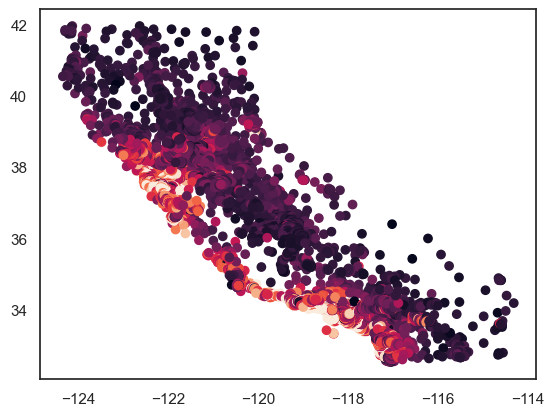

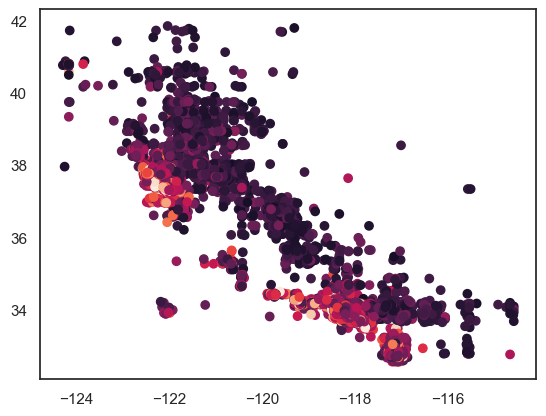

In [9]:
import matplotlib.pyplot as plt

plt.scatter(real["longitude"], real["latitude"], c=real["median_house_value"])
plt.show()

plt.scatter(fake["longitude"], fake["latitude"], c=fake["median_house_value"])
plt.show()


## heloc renamed

In [2]:
real = pd.read_csv("heloc.csv")
fake = pd.read_csv("synth_samples/heloc_renamed_synthetic_translated.csv")

real.shape, fake.shape

((10459, 24), (10400, 24))

In [4]:
cat_cols = ["RiskPerformance"]

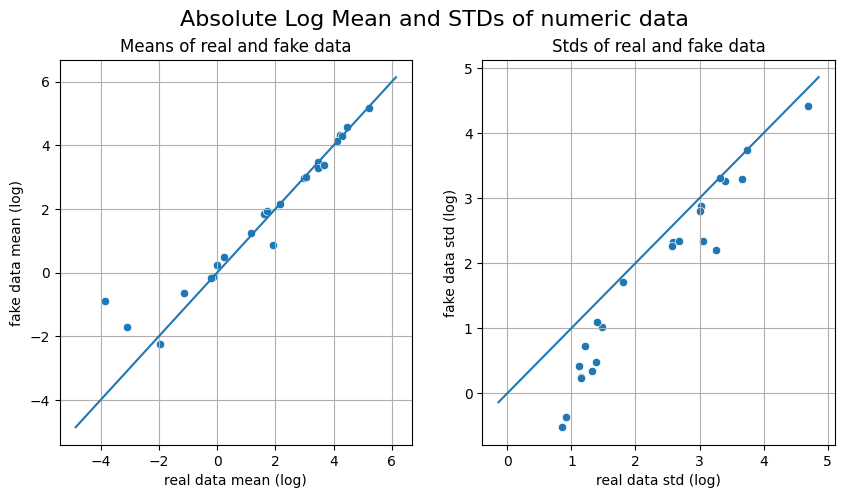

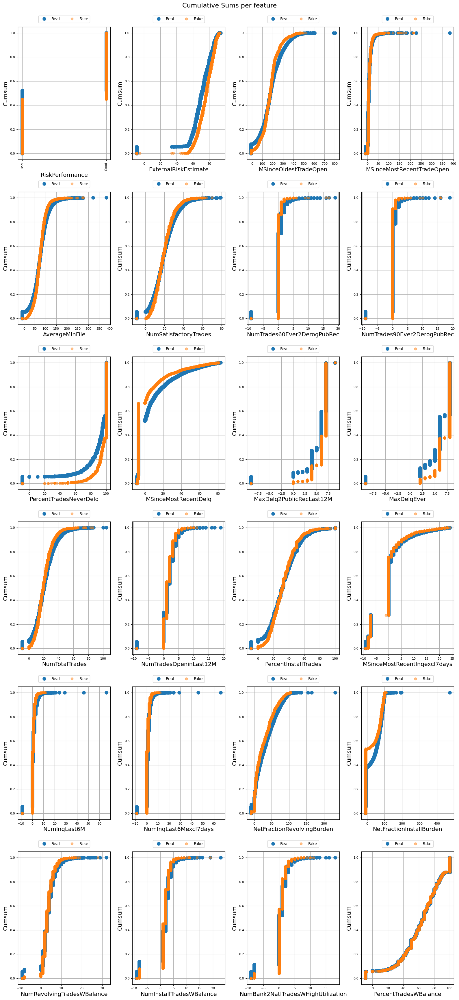

c:\Users\Ben\Documents\UCL\PhD\Research\LLMs_and_fairness\be_great_fairness\venv\lib\site-packages\table_evaluator\table_evaluator.py:182: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation='vertical')


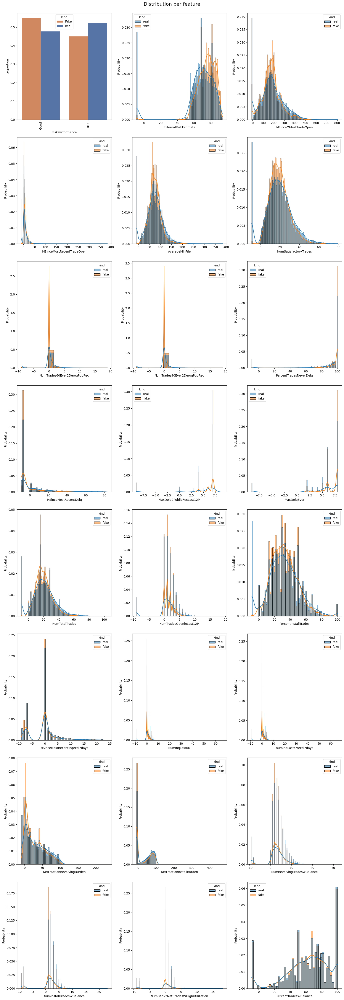

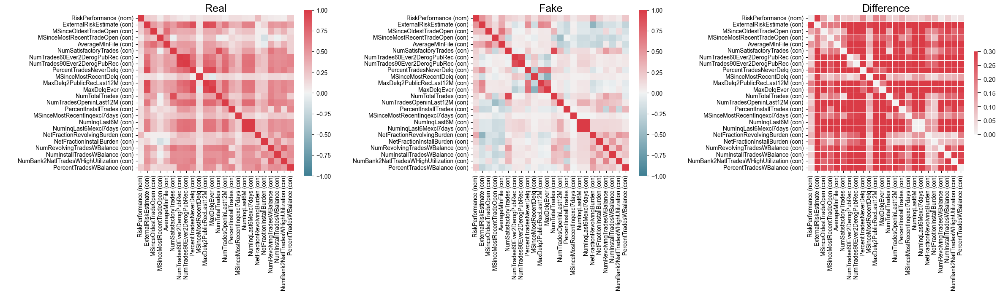

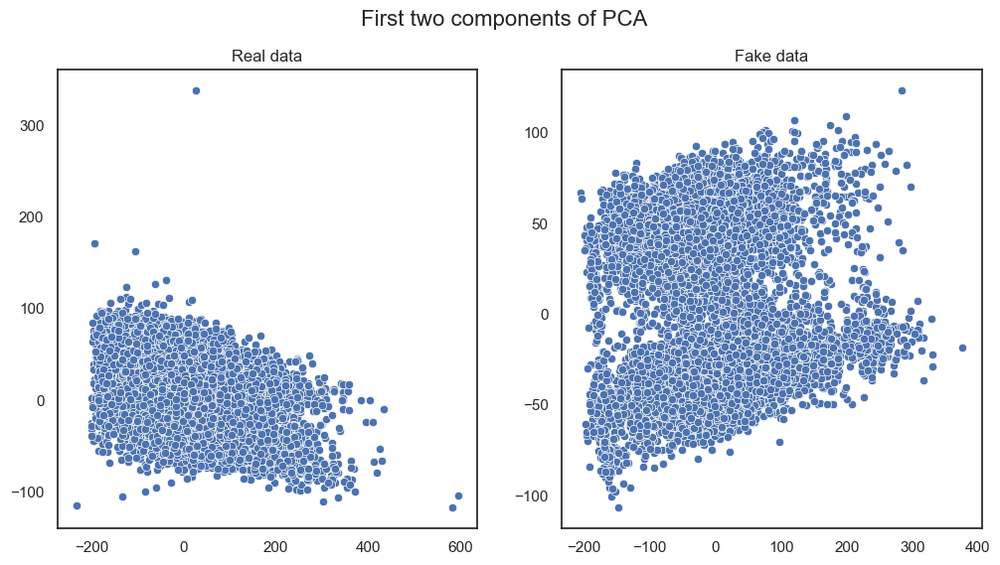

In [5]:
table_eval = TableEvaluator(real, fake, cat_cols=cat_cols)
table_eval.visual_evaluation()

## other dataset